In [1]:
### IMPORT EXTERNAL FUNCTIONS
import mne
import numpy as np
from os.path import join
import os
import glob
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from mne.preprocessing import ICA, read_ica
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from mne.preprocessing import corrmap, create_ecg_epochs, create_eog_epochs

import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))


### Overview

- Loads data (single sub)
- Checks unit of raw data (without any manipulation of raw, just checking)
- Dropping channels that aren't of interest, and setting channel types (you will want to keep X.Y,Z channels though!)
- Re-scales data and replaces raw (if check above suggests that data is in "raw units ADC" from amplifier. If one needs to be rescaled all do, but I keep the check in here just so I/we know what's going on and why we're rescaling)
- Set montage (so that each electrode has it's location when we use scalp tophographies for visualisations and electrode placement (and later for other stuff I assume))
- High- and low-pass filter + notch filter
- Annotate breaks, so that beginning, breaks between blocks, and end isn't included in the analyses. I found that if we crop the event timings get shifted, if we just annotate here then we don't shift any times and events around, and the "bad" parts are not included in analyses.
- Plot raw trace and manually annotate bad parts of raw trace (I think only the most obvious movements/artefacts with huge shifts amplitude). Annotating can be done when seeing raw traces interactivately, click "a" on keybord to get the "helper/info" and then type "movement" straight away and hit enter. This creates a new "marker" which you then use to mark bad segments (click and drag over the bad segments). Also remove obviously bad channels here (more info at that stage).
- Following this, when the obviously bad movements/artefacts/channels are removed, we can run some checks on channels to check if they are likely to be bad or not - see more info at that point in the notebook. I still don't know what's "appropriate" to do here, but the code is there if useful, and if the results can be used to guide selection of channels?
- After all removal -> re-reference to average
- Run ICA and save it so I don't need to re-run it later (if everything is identical in preprocessing), but can load it and apply it to the data again with e.g., other components removed etc. 
- Plot ICA components to see topographies, time series of components, how much variance is explained by the components etc (I don't really understand this variance fully, what is good and what is bad? Is there a good and bad?). Then some mne functions that "automatically" suggests which components are likely to be ECG, EOG, and mostly muscle noise. I think for now i prefer to do it manually, and use these checks as guides and compare to what I think the components are - see more notes at that point in the notebook.
- Select bad components and remove them 
- Apply the ICA to data
- After this the preprocessing of raw data is done. 


I then have parts where I epoch the data, and then remove bad epochs (the parts I have previously marked as bad are still in the data, because when I load the epochs I tell it to also include what segments of the raw trace I marked as bad to be excluded. I found that if I exclude the "bad_movement" I marked manually before ICA, all my epoch indexes are shifted because parts of the data has been removed, so the behavioural file index and actual remaining data indexes are not matching and I'm pulling the wrong epochs in my extract epoch functions. By keeping the "bad_movement" data in when I extract epochs, no data is removed when epochs are created, so I will have to quickly go over and just remove those that are bad again). This could probably be done in a smoother way, but I don't find this too annyoing to do, at epoch level it doesn't take too long to quickly scan through. 


I plot (and save) PSDs regularly to see what the impact the different preprocessing steps have. Might not be necessary later on - but for now i find it ok. 
I also save the file after some steps (it is marked when saved), so that the steps that takes long/are tedious don't have to be re-done all the time if wanting to test different methods etc. 

In [2]:
# Session to preprocess
session_id = ["sub015 DBS OFF MID"]

# Paths personal comp.
data_path = "/Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/WP3 Task Force/DATA"
saving_path = "/Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output"

# Paths work. comp. 
#data_path = "C:\\Users\\chst14\\OneDrive - Charité - Universitätsmedizin Berlin\\WP3 Task Force\\DATA"
#saving_path = "C:\\Users\\chst14\\OneDrive - Charité - Universitätsmedizin Berlin\\phd_charite\\WP3\\eeg_output"


# Loop through each session_id and extract cue and feedback epochs
for sub in session_id:
    #dbs_cond = sub[7:14].strip()
    
    subject_path = join(data_path, sub[:6])
    synch_path = join(subject_path, 'synced_data')
    
    if "DBS ON" in sub:
        filepath = join(synch_path, sub)
        for filename in os.listdir(filepath):
                #if "DBSfiltered" in filename:
                if "SYNCHRONIZED_EXTERNAL" in filename:
                    fname = filename
                    print(fname)
    else:
        # Get path to ephys file
        filepath = join(synch_path, sub)
        for filename in os.listdir(filepath):
                if "SYNCHRONIZED_EXTERNAL" in filename:
                    fname = filename
                    print(fname)

    # load ephys file
    eeg_file = join(filepath, fname)
    raw = mne.io.read_raw(eeg_file, preload=True)
    raw_test_filtered = raw.copy().filter(1, None) # this is only for the cell block below to check values, isn't applied to main data



SYNCHRONIZED_EXTERNAL_sub-015_ses-MID_OFF_task-Default_run-001_eeg.set
Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.6s


### Check raw data - what is the unit?

Code below is to check the raw values of our data. 

If in thousands, suggestive of being in raw ADC counts (raw counts from amplifier), and not in Volts (which is what MNE expects and works with).

For our checks we will use microvolts, as these values are easier to interpret than Volts and is what is typically referred to in literature.

No modification of raw is happening - variable names are used only here for checking values.

In [3]:
# Crop to remove stim artefact at beginning and end, will give us large values even if data were scaled
# Get total duration in seconds
test_duration = raw.times[-1]
test_crop = raw_test_filtered.copy().crop(tmin=60, tmax=test_duration - 60)

# Check raw values before scaling data and dropping channels
check_raw_vals = test_crop.copy().get_data()
print(f"Before scaling and dropping channels (only cropped out stim pulse at beginning and end + 1Hz highpass): min={check_raw_vals.min():.2f}, max={check_raw_vals.max():.2f}")

# Drop channels so we only have the EEG channels to look at the values for (AUX will be very large!)
test_drop = test_crop.copy()
test_drop.drop_channels(['CREF', 'X', 'Y', 'Z', 'TRIGGERS', 'STATUS', 'COUNTER', 'BIP 01', 'BIP 02', 'BIP 03'])

test_drop_data = test_drop.get_data()
print(f"After dropping channels (Raw data from EEG channels, stim pulse cropped out): min={test_drop_data.min():.2f}, max={test_drop_data.max():.2f}")

# Scaling this data from ADC counts to microVolts:
data_to_scale_test = test_drop_data
scaled_data_test = data_to_scale_test * 0.01788  # Converts raw ADC counts to µV
print(f"After scaling: min={scaled_data_test.min():.2f}, max={scaled_data_test.max():.2f}")



Before scaling and dropping channels (only cropped out stim pulse at beginning and end + 1Hz highpass): min=-91314.51, max=88033.90
After dropping channels (Raw data from EEG channels, stim pulse cropped out): min=-414.61, max=400.59
After scaling: min=-7.41, max=7.16


If values above are suggesting scaling is needed, that will follow after the next cell block.

#### Set channel types for BIP and drop other channels

In [4]:
# We want to drop channels we're not interested in first, because applying scaling factor to non-EEG channels
# doesn't necessarily make sense
raw.drop_channels(['CREF', 'X', 'Y', 'Z', 'TRIGGERS', 'STATUS', 'COUNTER', 'BIP 01'])
raw.set_channel_types({'BIP 02': 'ecg', 'BIP 03': 'eog'}) 

<RawEEGLAB | SYNCHRONIZED_EXTERNAL_sub-015_ses-MID_OFF_task-Default_run-001_eeg.set, 34 x 2209121 (1078.7 s), ~573.1 MB, data loaded>

#### Scaling from ADC counts to (micro)Volts
Scaling factor is obtained by the amplifier. For SAGA:
- Input range: +/- 150 microvolts (=0.3 Volts, 300,000 microVolts)
- Resolution: 24 bits

Scaling factor = input range in (micro)Volts/2^resolution (see note below for micro/volts)
- For Volts = 0,3 / 2^24
- For Microvolt = 300,000 / 2^24

**If input range used to get scaling factor is volts or microvolts depends on what we want our scaled data to be. We want to work with volts, as that's what mne expects.**

V_per_count =  0.0000000178814

uV_per_count = 0.01788

In [5]:
# Scale data from ADC counts to (micro)volts
data_to_scale = raw.copy().get_data()
scaled_data = data_to_scale * 0.01788  # Converts raw ADC counts to µV -> Doing microvolts for checkbecause those are easier to interpret if in ok range than Volts
#scaled_data = data_to_scale * 0.0000000178814  # Converts raw ADC counts to V -> Will do this in next cell after verifying values are ok
print(f"After scaling: min={scaled_data.min():.3f}, max={scaled_data.max():.3f}")
print("Values here likely larger than what we saw above, because here we have the stim artefacts included, as well as the EOG and ECG channels. \n For our 'real' rescaling of the data we don't want to crop our stream and shift events around, stim artefact will be annotated as bad later.")



After scaling: min=-607.612, max=17.549
Values here likely larger than what we saw above, because here we have the stim artefacts included, as well as the EOG and ECG channels. 
 For our 'real' rescaling of the data we don't want to crop our stream and shift events around, stim artefact will be annotated as bad later.


In [6]:
# Scaling factors
uV_per_count = 0.01788 # scaling factor for microvolts
V_per_count =  0.0000000178814 # scaling factor for volts

# Rescale
data_to_scale = raw.copy().get_data()
scaled_data = data_to_scale * V_per_count 
print(f"After scaling: min={scaled_data.min():.6f}, max={scaled_data.max():.6f}")


After scaling: min=-0.000608, max=0.000018


In [7]:
# Replace raw data with the scaled data. NOTE: Because we replace the raw, if you re-run the cell above without resetting variables, 
# you are scaling the raw-scaled data again
raw._data = scaled_data
print(f"Raw data replaced with scaled data")


Raw data replaced with scaled data


##### Set montage


In [8]:
data = []
data = raw.set_montage('standard_1020', match_case=False, match_alias=True, on_missing='warn') 

#### Plot raw PSD

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


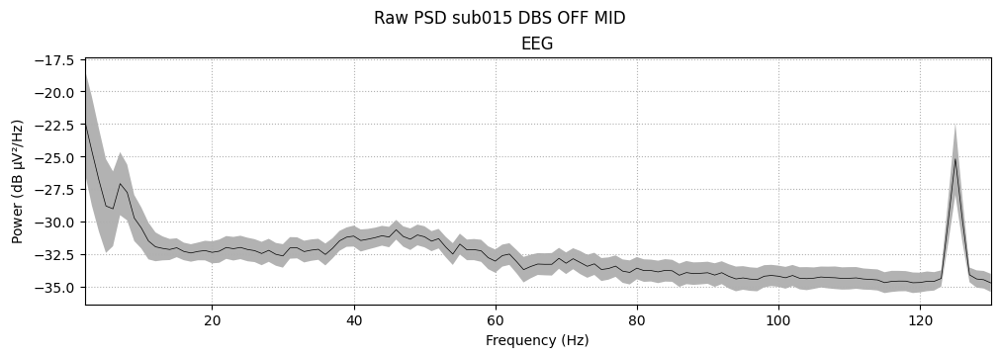

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


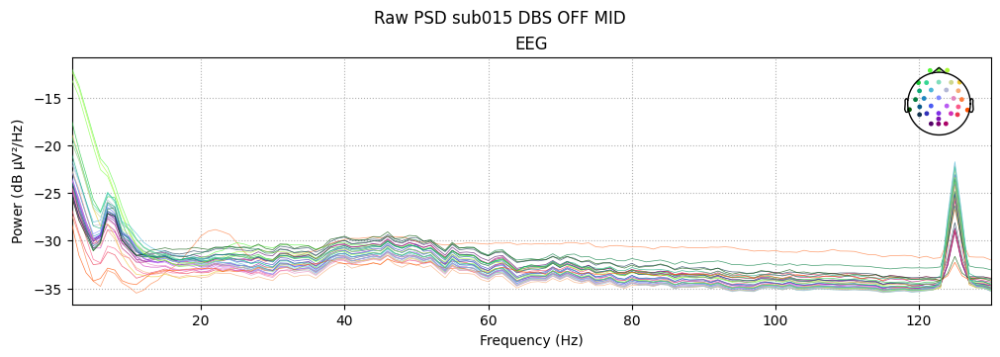

In [14]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_raw_avg = data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=130, n_fft=2048, n_overlap=1024, window="hamming")
psd_raw_avg.plot(dB=True, average=True).suptitle(f"Raw PSD {sub}")
plt.show()

### Plot PSD of signal (not averaging)
psd_raw = data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=130, n_fft=2048, n_overlap=1024, window="hamming")
psd_raw.plot(dB=True, average=False).suptitle(f"Raw PSD {sub}")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
os.makedirs(sub_save_path, exist_ok=True)  # Create the directory if it doesn't exist
plt.savefig(join(sub_save_path, f"{sub}_raw_PSD_avg.png"), dpi=300)
plt.show()




Using matplotlib as 2D backend.


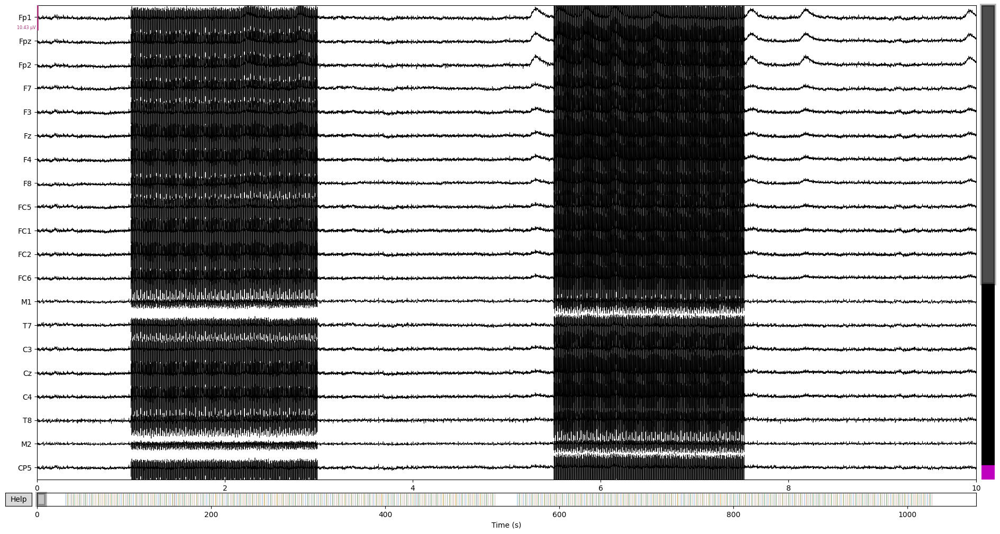

Channels marked as bad:
none


In [15]:
%matplotlib qt

data.plot(scalings="auto", title="Raw data")

### High- and low-pass filtering + notch

In [9]:
filt_eeg_data = []

filt_eeg_data = data.copy().filter(1,95).notch_filter(freqs=50) # do all filtering separately, J will check order and we can test different approaches 

#filt_eeg_data = data.copy().filter(1,95) # If not wanting notch filter

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 95 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 95.00 Hz
- Upper transition bandwidth: 23.75 Hz (-6 dB cutoff frequency: 106.88 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.9s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.8s


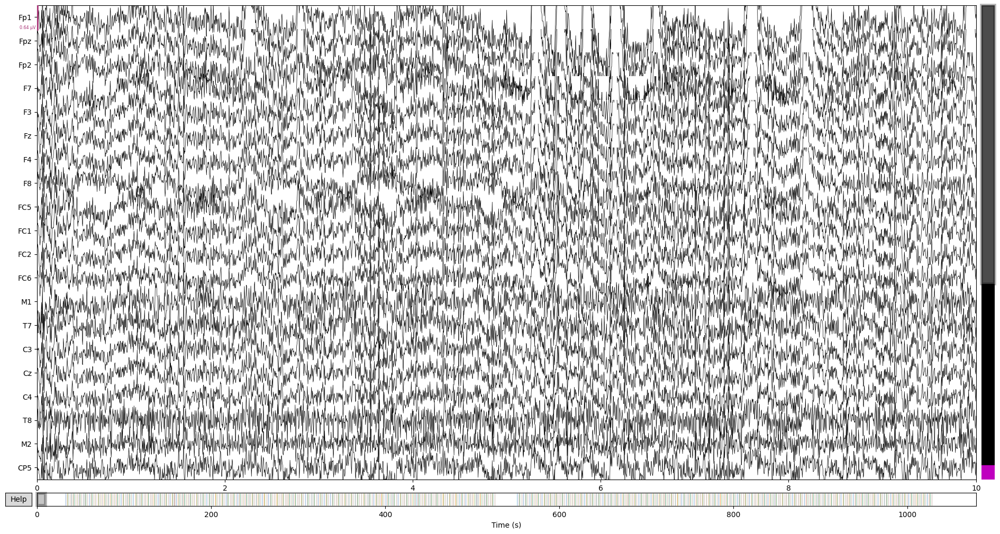

Channels marked as bad:
none


In [17]:
%matplotlib qt

filt_eeg_data.plot(scalings="auto", title="Filtered data")

#### Plot PSD after filtering

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


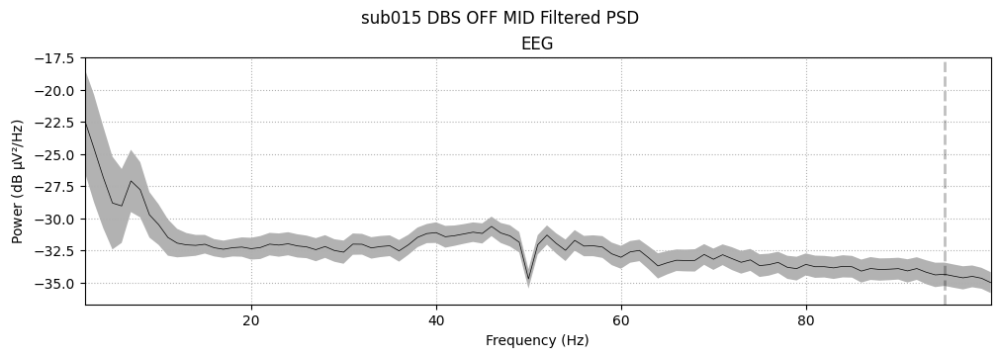

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


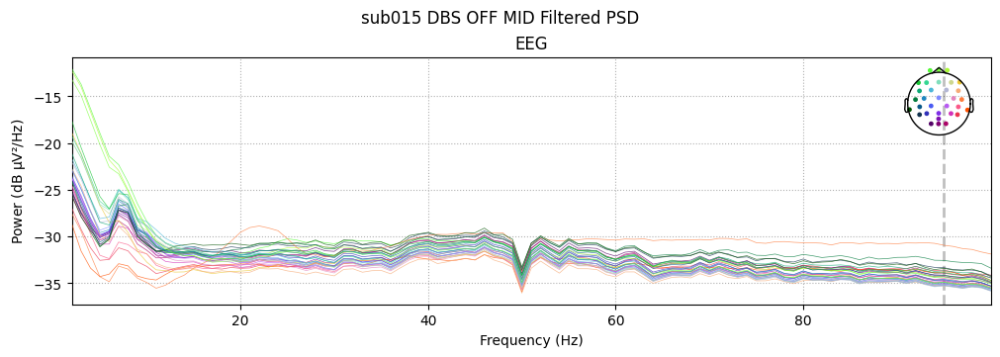

In [18]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_filt_avg = filt_eeg_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, n_fft=2048, n_overlap=1024, window="hamming")
psd_filt_avg.plot(dB=True, average=True).suptitle(f"{sub} Filtered PSD")
plt.show()

### Plot PSD of signal (not averaging)
psd_filt = filt_eeg_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, n_fft=2048, n_overlap=1024, window="hamming")
psd_filt.plot(dB=True, average=False).suptitle(f"{sub} Filtered PSD")
plt.show()

#### Annotating breaks
Breaks are recognised by time without event markers.
- Min_break_duration: How long time must be between event markers for this to be considered a break.
- t_start_after_previous & t_start_before_next: How many seconds should be after the last event marker before the break starts, and how many seconds before the first event marker should the break stop. 

In [10]:
break_annot = mne.preprocessing.annotate_break(filt_eeg_data, min_break_duration=10, t_start_after_previous=4, t_stop_before_next=4)


Ignoring annotations with descriptions starting with: bad, edge

Detected 3 break periods of >= 10 s duration:
    0.0 – 28.6 s [28.6 s]
    529.5 – 547.3 s [17.9 s]
    1031.7 – 1078.7 s [47.1 s]
In total, 8.7% of the data (93.5 s) have been marked as a break.



In [11]:
### Add the breaks to the annotations of the data
filt_eeg_break_data = []

filt_eeg_break_data = filt_eeg_data.set_annotations(raw.annotations + break_annot)

##### Visual check to see break is added at the correct places

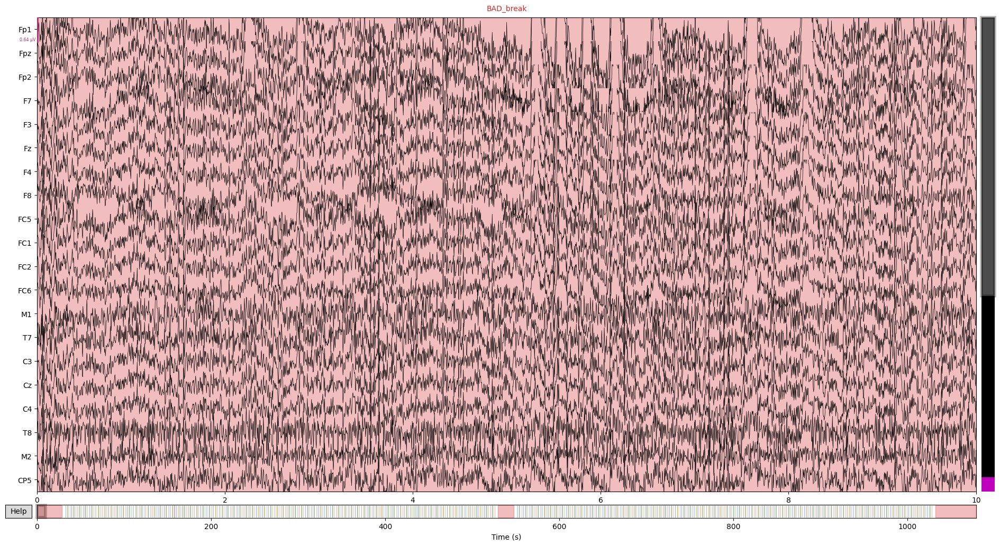

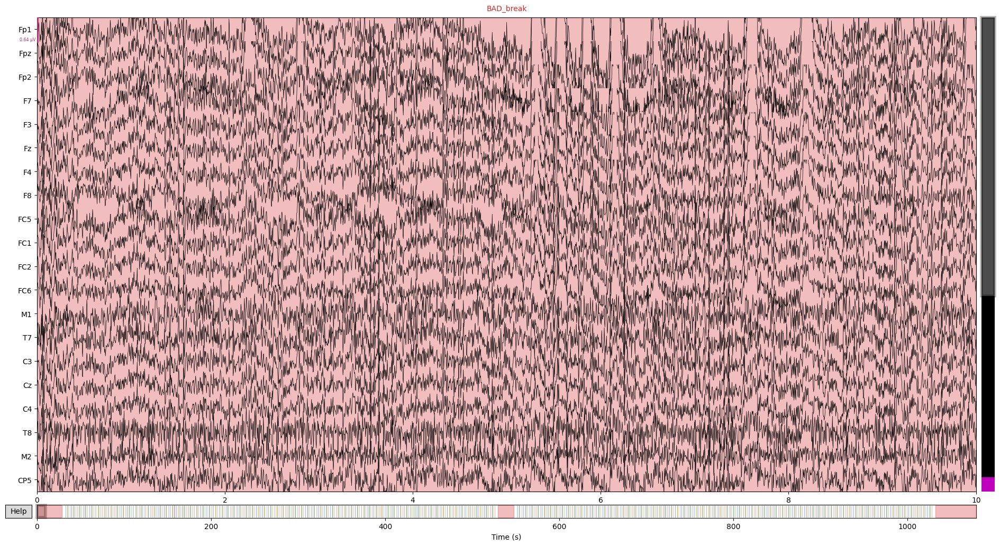

In [21]:
%matplotlib inline

# Plot signal (can check timeline on x-axis. The red blocks (break) should be where there are no event marker lines)
filt_eeg_break_data.plot(scalings="auto", title="Breaks added")

#### Plot PSD again - now breaks are not included in the PSD
Depending on how much data has been excluded (i.e. how long the breaks were), and how much artefacts due to movement etc. were in the breaks, the PSD will look more or less like the PSD from before annotating breaks. 

However, it is good to remove breaks from the data when we re-reference to average - we don't want the break activity to influence the average signal.

Setting 191397 of 2209121 (8.66%) samples to NaN, retaining 2017724 (91.34%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


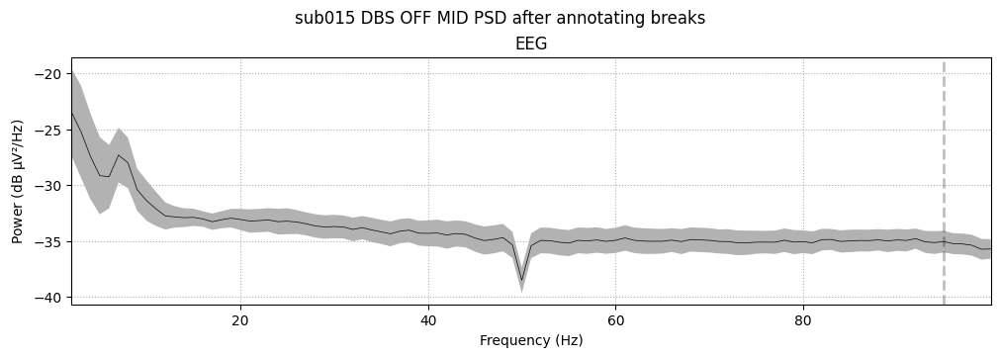

Setting 191397 of 2209121 (8.66%) samples to NaN, retaining 2017724 (91.34%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


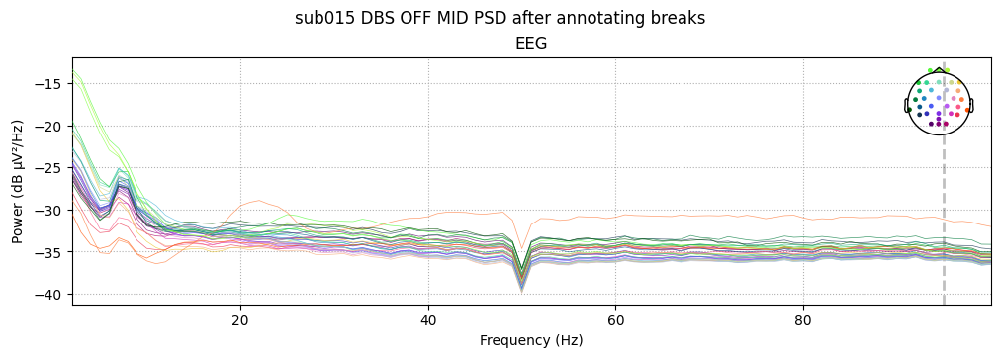

In [25]:
%matplotlib inline

#%matplotlib qt

### Plot PSD of signal (averaging all channels)
psd_noBreak_avg = filt_eeg_break_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
psd_noBreak_avg.plot(dB=True, average=True).suptitle(f"{sub} PSD after annotating breaks")
plt.show()

### Plot PSD of signal (not averaging)
psd_noBreakfilt = filt_eeg_break_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
psd_noBreakfilt.plot(dB=True, average=False).suptitle(f"{sub} PSD after annotating breaks")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
plt.savefig(join(sub_save_path, f"{sub}_filtered_noBreak_PSD.png"), dpi=300)
plt.show()

#### Plot data and identify (select by clicking on them) bad channels AND annotate bad segments (e.g., movement artefacts) before re-referencing to average
Noisy channel identification can also be guided by the PSD above (plotting it interactively you can hover over the channels and get their names). Remove the ones which are clearly way below or above the main groupings of channels (but not frontal ones, they are likely eyeblinks in the lower frequencies). Don't be too strict in removing channels I think - the removing is still something I'm not sure how to best approach. We don't want to remove too much, because then ICA will be bad because we have removed all "noise", but we also want to remove channels that are clearly flat, or only noise. 

After artefact removal, the file is saved.

In [12]:
%matplotlib qt

# Plot raw signal
filt_eeg_break_data.plot(scalings="auto", block=True) # Cell block waits for plot to be closed before continuing (i.e., saving)

save_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist

file_p = join(save_path, f"{sub.replace(' ', '_')}_artefacts_removed_EEGdata_eeg.fif")
filt_eeg_break_data.save(file_p, overwrite=True)

Using matplotlib as 2D backend.
Channels marked as bad:
none
Overwriting existing file.
Writing /Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output/sub_data/sub015 DBS OFF MID/data/sub015_DBS_OFF_MID_artefacts_removed_EEGdata_eeg.fif
Closing /Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output/sub_data/sub015 DBS OFF MID/data/sub015_DBS_OFF_MID_artefacts_removed_EEGdata_eeg.fif
[done]


##### If already removed artefacts, load file from previous session so we don't need to repeat these steps

In [9]:
temp_sub = sub.replace(' ', '_')
filename = join(saving_path, "sub_data", sub, "data", f"{temp_sub}_artefacts_removed_EEGdata_eeg.fif")

filt_eeg_break_data = mne.io.read_raw(filename, preload=True)

Opening raw data file C:\Users\chst14\OneDrive - Charité - Universitätsmedizin Berlin\phd_charite\WP3\eeg_output\sub_data\sub015 DBS OFF MID\data\sub015_DBS_OFF_MID_artefacts_removed_EEGdata_eeg.fif...
    Range : 0 ... 2209120 =      0.000 ...  1078.701 secs
Ready.
Reading 0 ... 2209120  =      0.000 ...  1078.701 secs...


### Recognising bad channels by Z-scoring and looking at SD and variance in freq. and time domain

**PSD_Z:**
- Computes each channel’s average power (1–90 Hz) in dB, then z-scores across channels—so it flags electrodes whose overall spectral “bulk” is unusually high or low (e.g., a consistently noisy or dead contact) (A single value per channel, tells us whether the channel is generally noisier or quieter than the others) (looks at Frequency domain).

**P2P_Z:**
- Measures the maximum 250 ms peak-to-peak excursion per channel and z-scores those values—so it catches electrodes with extreme transients (cable pops, big spikes) or abnormally flat signals (looks at Time domain)
(Takes the highest voltage the channel reaches minus the lowest voltage it reaches—that difference is its peak-to-peak value.)

**Corr_Z:**
- Computes each channel’s mean Pearson correlation to all other channels, then z-scores—so it flags sensors that aren’t co-varying with the head (e.g., drifty or disconnected channels, channels that don't correlate with their neighbours).

**Var_Z:**
- Takes each channel’s overall variance and z-scores—so it highlights electrodes that are unusually “spiky” or “quiet” over the whole recording (looks at Time domain).

**Max_Freq_Z:**
- Looks for the largest per-frequency deviation (in z-units) from the grand mean spectrum—so it catches narrowband bursts (line-noise leakage, muscle peaks) that might be lost in the broad PSD average (=For each frequency bin look at how many SD above/below the across-channel mean power that channel’s power is at that exact frequency (i.e. a z-score at 10 Hz, at 20 Hz, etc.), and take whichever of those frequency-specific z-scores is largest in absolute value. That way, even if a channel’s overall PSD looks okay, a single narrowband spike (say a 50 Hz line-noise leak or a muscle peak at 80 Hz) will make its “max_freq_z” jump out.) (looks at Frequency domain).

#### Rule of thumb:
- If it fails two or more of the checks, probably bad - but do a visual check of PSD and raw trace
- Failing one check: Look at PSD and raw trace - if looking good, keep it in

**NOTE** Frontal channels can often be flagged, but that is likely because of eyeblinks, so don't necessarily remove them if the raw trace itself looks ok besides the eyeblink!

Setting 191397 of 2209121 (8.66%) samples to NaN, retaining 2017724 (91.34%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.


/opt/anaconda3/envs/mnelab/lib/python3.11/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)


>> PSD outliers (|z|>2.5): ['T8']
>> Peak-to-peak outliers (|z|>2.5): ['T8', 'M2']
>> Low-correlation outliers (corr_z < -2.5): ['T8']
>> Variance outliers (|z|>2.5): ['Fp1', 'Fp2']
>> Spectral‐spike outliers (max_freq_z>2.5): ['Fp1', 'Fp2', 'T8', 'M2']
>> Final flagged channels: ['Fp1', 'Fp2', 'T8', 'M2']
   Channel  PSD_Z  P2P_Z  Corr_Z  Var_Z  Max_Freq_Z  Flagged
0      Fp1   2.03   0.29   -1.66   3.46        2.76     True
1      Fpz   0.64   0.18   -1.32   2.31        2.38    False
2      Fp2   1.43   1.42   -1.80   3.09        2.61     True
3       F7   0.98   0.71   -0.60   0.72        1.11    False
4       F3  -0.09   0.38    0.53   0.11        1.25    False
5       Fz  -0.59   0.10    0.62  -0.07        1.17    False
6       F4  -0.70  -0.11    0.35  -0.14        1.12    False
7       F8  -0.47  -0.04   -1.69  -0.05        2.45    False
8      FC5   0.75   0.72    0.38  -0.00        0.90    False
9      FC1  -0.48   0.28    0.81  -0.23        1.72    False
10     FC2  -0.87  -0

/opt/anaconda3/envs/mnelab/lib/python3.11/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)


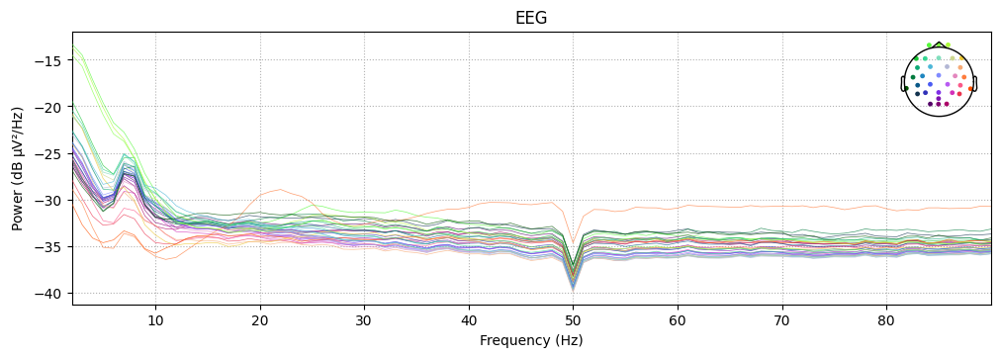

In [14]:
%matplotlib qt

# rename for readability
bad_chan_identifier = filt_eeg_break_data  

# pick only the EEG channels that aren’t already in raw.info['bads']
picks = mne.pick_types(bad_chan_identifier.info, meg=False, eeg=True, exclude='bads')

sfreq = bad_chan_identifier.info['sfreq']

# Frequency-domain PSD checks
psd_container = bad_chan_identifier.compute_psd(
    method="welch",
    picks=picks,
    fmin=1.0,
    fmax=90.0,
    n_fft=2048,
    window="hamming"
)

# Convert to dB and compute mean PSD per channel
psds     = psd_container.get_data()     # (n_picks, n_freqs)
psd_db   = 10 * np.log10(psds)
mean_psd = psd_db.mean(axis=1)
psd_z    = (mean_psd - mean_psd.mean()) / mean_psd.std()

# Peak-to-peak amplitude in 250 ms windows
data = bad_chan_identifier.get_data(picks=picks)     # (n_picks, n_times)
win_samp = int(0.25 * sfreq)
n_win    = data.shape[1] // win_samp
p2p_mat  = np.zeros((len(picks), n_win))
for w in range(n_win):
    seg = data[:, w*win_samp:(w+1)*win_samp]
    p2p_mat[:, w] = seg.max(axis=1) - seg.min(axis=1)
max_p2p = p2p_mat.max(axis=1)
p2p_z   = (max_p2p - max_p2p.mean()) / max_p2p.std()

# Channel–channel correlation 
corr      = np.corrcoef(data)
mean_corr = corr.mean(axis=0)
corr_z    = (mean_corr - mean_corr.mean()) / mean_corr.std()

# Compute time-domain variance per channel and z-score
# Flags channels with too much or too little amplitude variability over the rec (relative to the other electrodes),
# i.e., it could be flat or very spiky
chan_vars = np.var(data, axis=1)
var_z     = (chan_vars - chan_vars.mean()) / chan_vars.std()

# Compute frequency-wise z-scores and max deviation per channel
# Looks for channels which have high spikes in some frequencies, could indicate e.g., line noise or muscle artefact
mean_freq   = psd_db.mean(axis=0)
std_freq    = psd_db.std(axis=0)
freq_z      = (psd_db - mean_freq) / std_freq
max_freq_z  = np.max(np.abs(freq_z), axis=1)

# Threshold all metrics at ±2.5 Z
thresh = 2.5
mask_psd   = np.abs(psd_z)    > thresh
mask_p2p   = np.abs(p2p_z)    > thresh
mask_corr  = corr_z           < -thresh    # flag very low corr (z < -2.5)
mask_var   = np.abs(var_z)    > thresh
mask_freq  = max_freq_z       > thresh

# combine
mask_all = mask_psd | mask_p2p | mask_corr | mask_var | mask_freq
bad_channels = [bad_chan_identifier.ch_names[picks[i]]
                for i, m in enumerate(mask_all) if m]

# Print per-metric flagged channels
print(">> PSD outliers (|z|>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_psd)[0]])
print(">> Peak-to-peak outliers (|z|>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_p2p)[0]])
print(">> Low-correlation outliers (corr_z < -2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_corr)[0]])
print(">> Variance outliers (|z|>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_var)[0]])
print(">> Spectral‐spike outliers (max_freq_z>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_freq)[0]])
print(">> Final flagged channels:", bad_channels)

# Summarize in a DataFrame 
df = pd.DataFrame({
    "Channel":     [bad_chan_identifier.ch_names[p]      for p in picks],
    "PSD_Z":       np.round(psd_z,    2),
    "P2P_Z":       np.round(p2p_z,    2),
    "Corr_Z":      np.round(corr_z,   2),
    "Var_Z":       np.round(var_z,    2),
    "Max_Freq_Z":  np.round(max_freq_z,2),
    "Flagged":     mask_all
})
print(df)

# Visual check: all individual PSDs
bad_chan_identifier.plot_psd(
    fmin=1.0, fmax=90.0,
    picks=picks,
    dB=True,
    average=False,
    show=True
)


#### Plot PSD of individual channels flagged above and decide whether to remove or keep them in
For example, if Fp2 and Fp1 are flagged, this is likely eyeblinks (high power in low frequencies), so do not remove it

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)


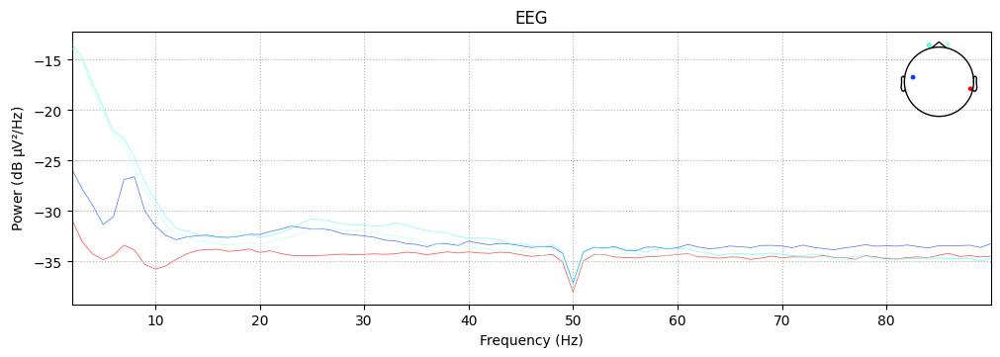

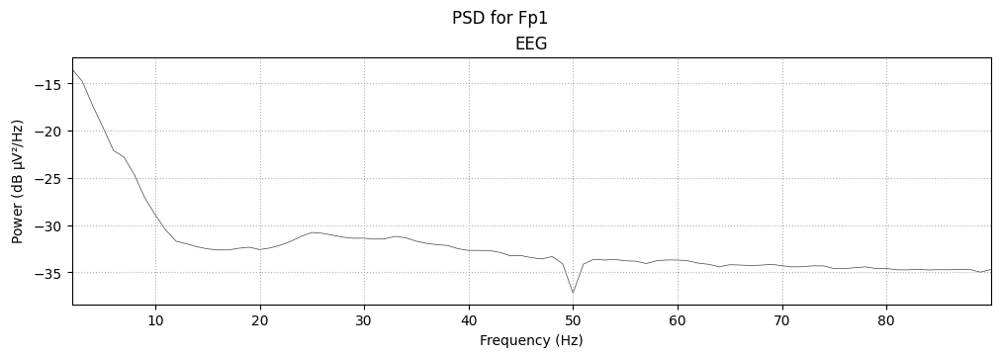

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)


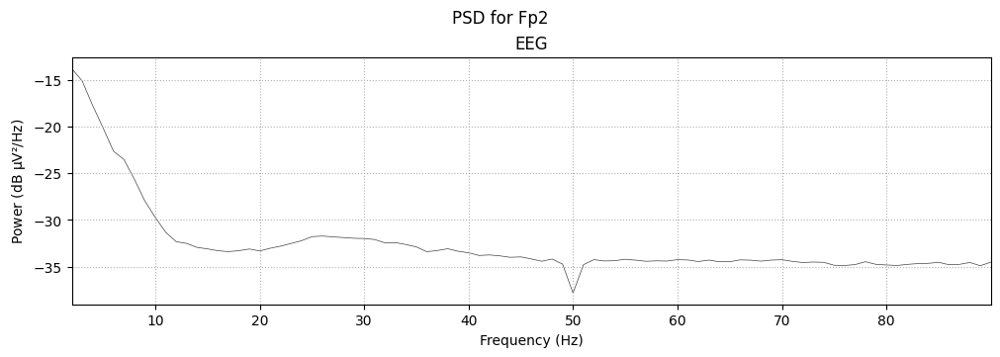

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)


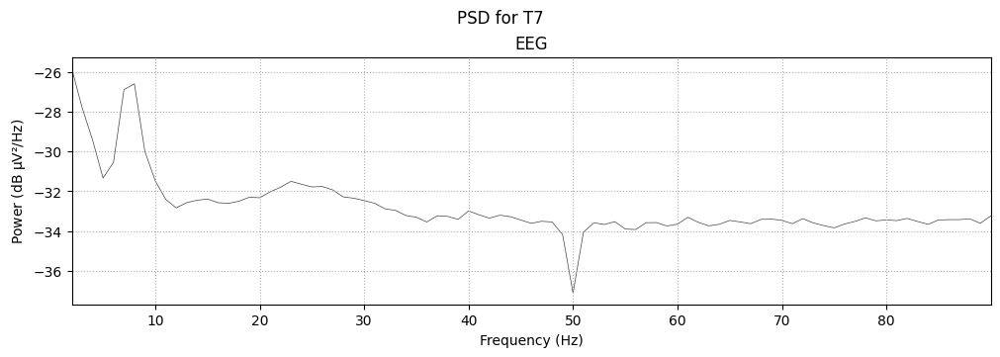

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)


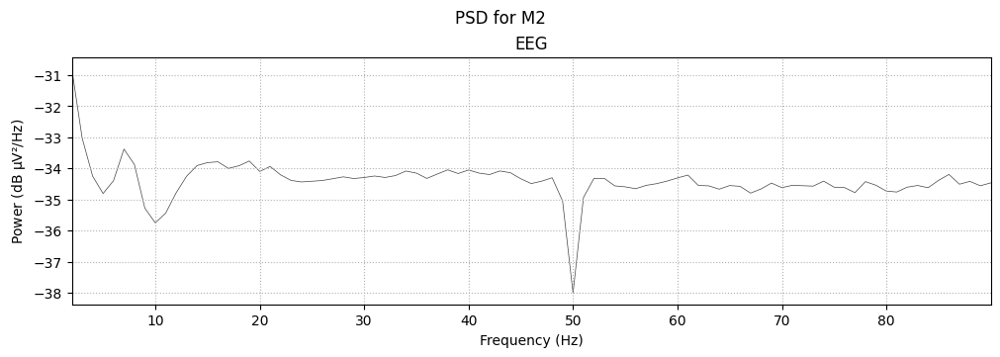

In [17]:
%matplotlib inline 

# picks can be either indices or names
picks = mne.pick_channels(bad_chan_identifier.ch_names, include=bad_channels)

# compute PSD of bad channels
bad_chan_identifier.plot_psd(
    fmin=1.0,
    fmax=90.0,
    picks=picks,
    dB=True,
    average=False,
)

for ch in bad_channels:
    # one figure per channel
    fig = bad_chan_identifier.plot_psd(
        fmin=1.0,
        fmax=90.0,
        picks=[ch],
        dB=True,
        average=False,
        show=False   
    )
    fig.suptitle(f'PSD for {ch}')
    plt.show()


#### Plot channel traces for visual inspection and select bad ones guided by metrics above and visual check here

In [15]:
%matplotlib qt

# Plot raw signal
bad_chan_identifier.plot(scalings="auto", block=True) # Cell block waits for plot to be closed before continuing (i.e., saving)

save_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist

file_p = join(save_path, f"{sub.replace(' ', '_')}_art_and_chan_removed_eeg.fif")
bad_chan_identifier.save(file_p, overwrite=True)

Channels marked as bad:
none
Overwriting existing file.
Writing /Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output/sub_data/sub015 DBS OFF MID/data/sub015_DBS_OFF_MID_art_and_chan_removed_eeg.fif
Closing /Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output/sub_data/sub015 DBS OFF MID/data/sub015_DBS_OFF_MID_art_and_chan_removed_eeg.fif
[done]


#### After identifying noisy channels and bad segments, re-reference to average
It's important at this step that only channels that are EEG channels, have the EEG label! (see first step of script (after loading data))

In [30]:
 # ensure bad channels are listed here, otherwise they will be included in the average reference
bad_chan_identifier.info['bads']

[np.str_('T8'), np.str_('M2'), np.str_('T7')]

In [18]:
av_ref_data = []
av_ref_data = bad_chan_identifier.copy().set_eeg_reference(ref_channels="average")


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


#### Plot PSD again

Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


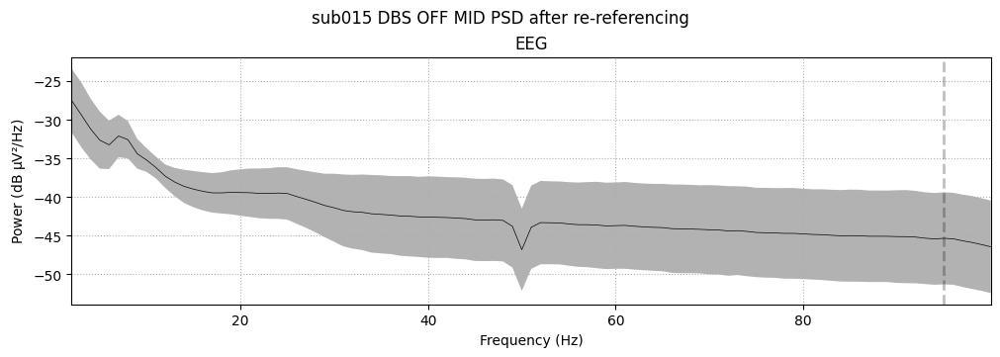

Setting 210318 of 2209121 (9.52%) samples to NaN, retaining 1998803 (90.48%) samples.
Effective window size : 1.000 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\time_frequency\psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1, using nperseg = 1
  return _func(*args, **kwargs)
c:\Users\chst14\AppData\Local\anaconda3\envs\mnelab\Lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


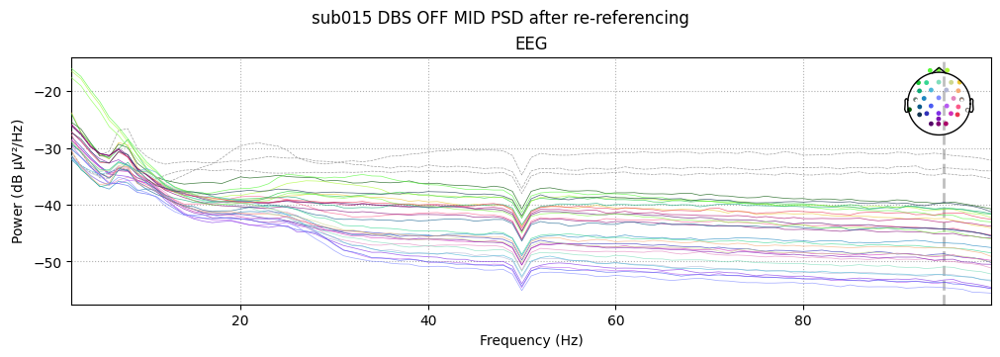

In [32]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_final_avg = av_ref_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
psd_final_avg.plot(dB=True, average=True).suptitle(f"{sub} PSD after re-referencing")
plt.show()

### Plot PSD of signal (not averaging)
psd_final = av_ref_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
psd_final.plot(dB=True, average=False).suptitle(f"{sub} PSD after re-referencing")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
plt.savefig(join(sub_save_path, f"{sub}_after_reRef.png"), dpi=300)
plt.show()

In [ ]:
%matplotlib qt
av_ref_data.plot(scalings="auto", title="After re-referencing to average")

### Independent Component Analysis
If ICA has already been fitted for this subject, it will be loaded.
If ICA hasn't been fitted, it will be.

In [16]:
# Dictionary to store the fitted or loaded ICA objects
ica_fit_dict = {}
 
# Construct the file path for the ICA file
ica_file_path = join(saving_path, 'sub_data', f"{sub}", f"{sub}-ica.fif")
    
# Check if the ICA file exists
if os.path.exists(ica_file_path):
    # If it exists, load the ICA object
    ica = read_ica(ica_file_path)
    print(f"Loaded ICA for {sub} from {ica_file_path}")

else:
    # If it doesn't exist, fit ICA to the data
    ica = ICA(n_components=None, random_state=11, method='infomax') # Number of components is chosen by function to account for 99%
    ica.fit(av_ref_data.copy().pick_types(eeg=True, eog=True, ecg=True))                                  
   
    # Save the ICA object to file (saving the ICA decomposition, not any raw/cleaned data)
    ica.save(ica_file_path)
    print(f"Fitted and saved ICA for {sub} at {ica_file_path}")
    
ica_fit_dict = ica

Reading /Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output/sub_data/sub015 DBS OFF MID/sub015 DBS OFF MID-ica.fif ...
Now restoring ICA solution ...
Ready.
Loaded ICA for sub015 DBS OFF MID from /Users/charlotte/Library/CloudStorage/OneDrive-Charité-UniversitätsmedizinBerlin/phd_charite/WP3/eeg_output/sub_data/sub015 DBS OFF MID/sub015 DBS OFF MID-ica.fif


#### Components identified
By clicking on the components you will get more info about them (only in interactive mode (qt))

In [ ]:
%matplotlib qt

#%matplotlib inline

ica.plot_components(inst=av_ref_data,  psd_args={'fmin': 1, 'fmax': 90}) #Topographies of each component


[<MNEFigure size 1950x1694 with 20 Axes>, <MNEFigure size 975x496 with 8 Axes>]

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
490 matching events found
No baseline correction applied
0 projection items activated


Creating RawArray with float64 data, n_channels=30, n_times=2209121
    Range : 0 ... 2209120 =      0.000 ...  1078.701 secs
Ready.


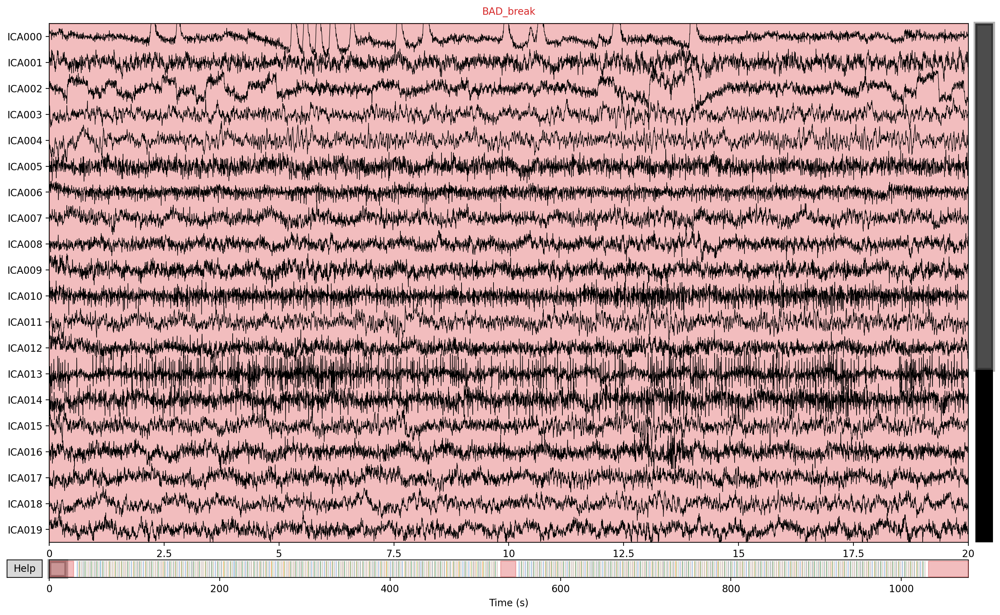

In [20]:
%matplotlib qt
ica.plot_sources(av_ref_data) #Timeseries of each ICA component

#### Percentage variance explained by all components together, and each individual component

In [35]:
explained_var_ratio = ica.get_explained_variance_ratio(av_ref_data)
for channel_type, ratio in explained_var_ratio.items():
    print(f"Fraction of {channel_type} variance explained by all components: {ratio}")

Fraction of eeg variance explained by all components: 1.0


#### Variance explained by each component
"ICA components are not orthogonal in sensor space, so their individual variances can overlap (and even be negative)" - from MNE docs
= the ratios add up to more than one. They have shared variances in the output I get here.

In [36]:
ch_types = ("eeg",)
var_explained = pd.DataFrame(columns=ch_types, index=pd.RangeIndex(ica.n_components_, name="Component"))

for component_idx in range(ica.n_components_):
    ratios = ica.get_explained_variance_ratio(
        av_ref_data,
        components=component_idx,
        ch_type="eeg"
    )
    
    var_explained.loc[component_idx, "eeg"] = ratios["eeg"]

var_explained


,eeg
Component,
0,0.649181
1,0.306124
2,0.289359
3,0.24473
4,0.234939
5,0.234195
6,0.232361
7,0.22809
8,0.228789


#### Automatic identification of ECG and EOG components

In [ ]:
# Identifies which components are likely ECG and EOG (does not exclude them, just shows components!)
ecg_ind, ecg_scores = ica.find_bads_ecg(av_ref_data, ch_name="BIP 02")
eog_ind, eog_scores = ica.find_bads_eog(av_ref_data, ch_name="BIP 03")

print(f"ECG components identified: {ecg_ind}")
print(f"EOG components identified: {eog_ind}")

In [ ]:
# Plot (likely) ECG components
ica.plot_components(picks=ecg_ind)

In [ ]:
# Plot (likely) EOG components
ica.plot_components(picks=eog_ind)

#### Get visuals for EOG components identified 
Useful in deciding whether the component(s) are likely to reflect EOG activity or not.

In [ ]:
%matplotlib qt
#%matplotlib inline

# barplot of ICA component "EOG match" scores
ica.plot_scores(eog_scores)

# plot diagnostics
ica.plot_properties(av_ref_data, picks=eog_ind)

# plot ICs applied to raw data, with EOG matches highlighted
ica.plot_sources(av_ref_data, show_scrollbars=True)

# plot ICs applied to the averaged EOG epochs, with EOG matches highlighted
eog_evoked = create_eog_epochs(av_ref_data).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()
ica.plot_sources(eog_evoked)
 

#### Get visuals for ECG components identified 
Useful in deciding whether the component(s) are likely to reflect ECG activity or not.

In [ ]:
%matplotlib qt
#%matplotlib inline

# barplot of ICA component "EOG match" scores
ica.plot_scores(ecg_scores)

# plot diagnostics
ica.plot_properties(av_ref_data, picks=ecg_ind)

# plot ICs applied to raw data, with EOG matches highlighted
ica.plot_sources(av_ref_data, show_scrollbars=True)

# plot ICs applied to the averaged EOG epochs, with EOG matches highlighted
ecg_evoked = create_ecg_epochs(av_ref_data).average()
ecg_evoked.apply_baseline(baseline=(None, -0.2))
ecg_evoked.plot_joint()
ica.plot_sources(ecg_evoked)
 

#### Automatic detection of muscle artefacts

In [ ]:
muscle_idx_auto, scores = ica.find_bads_muscle(av_ref_data)
ica.plot_scores(scores, exclude=muscle_idx_auto)
print(
    f"Automatically found muscle artifact ICA components: {muscle_idx_auto}"
)

#### Which components would we want to exclude (manual exclusion)?
We can use the automatic identification of EOG and ECG from step above as information, but we don't have to choose all of the identified components above if we have reason to believe they're not all correctly identified

In [ ]:
to_exclude = [0, 3, 4, 6, 9, 11, 12, 17, 18, 19, 20, 22, 23] # saving this in variable for easier input below

#### What would the signal look like if removing components based on EOG and ECG channels, by manual selection, and both

- Red = before removing components
- Black = after removing components

In [ ]:
%matplotlib inline

# Preview after removing ECG + EOG components only
ica.plot_overlay(av_ref_data, exclude=ecg_ind + eog_ind, title='After removing ECG/EOG')

# Preview after removing muscle components only
ica.plot_overlay(av_ref_data, exclude=muscle_idx_auto, title='After removing muscle components')

# Preview after removing manual components only (input which component index you want to remove to preview)
ica.plot_overlay(av_ref_data, exclude=to_exclude, title='After removing manual component(s)')

# Preview after removing both ECG/EOG + muscle_idx_auto + manual components
ica.plot_overlay(av_ref_data, exclude=to_exclude + ecg_ind + eog_ind + muscle_idx_auto, title='After removing all selected components')


### Exclude components + apply ICA
Two ways to explude:
- Manually: Choosing which components ourselves, is the variable created 2 cells above (would recommend this)
- Automatically: Components that were identified as likely to be ECG and EOG are excluded (wouldn't always trust this? Not sure about the ECG detection, and it doesn't always recognise lateral eyemovement artefacts)

In [ ]:
ica.exclude = to_exclude # exclude components manually by adding component number here

#ica.exclude.extend(ecg_ind + eog_ind) # exclude automatically using the ECG and EOG channels, can also add muscle_idx_auto here if you want to exclude those as well


In [ ]:
# Apply ICA to the data
data_after_ica = ica.apply(av_ref_data)

In [ ]:
ica # here we can check that the correct components have been excluded, gives us ica info

#### Save file after ICA

In [ ]:
save_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist

file_p = join(save_path, f"{sub.replace(' ', '_')}_postICA_EEGdata_eeg.fif")
data_after_ica.save(file_p, overwrite=True)

#### If saved previously, load it:


In [ ]:
temp_sub = sub.replace(' ', '_')
filename = join(saving_path, "sub_data", sub, "data", f"{temp_sub}_postICA_EEGdata_eeg.fif")

data_after_ica = mne.io.read_raw(filename, preload=True)

### Plot PSD after ICA

In [ ]:
%matplotlib inline

### Plot PSD of signal (not averaging)
psd_after_ica = data_after_ica.compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
psd_after_ica.plot(dB=True, average=False).suptitle(f"{sub} PSD after ICA")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
plt.savefig(join(sub_save_path, f"{sub}_after_ICA_PSD.png"), dpi=300)
plt.show()

### Visual inspection of data after preprocessing and filtering
ECG or EOG artefacts still present?

In [ ]:
%matplotlib qt

data_after_ica.plot(scalings="auto")

## Extract epochs for visual artefact rejection

Here I use MID epochs. I included it in the preprocessing step for now at least, just to "fully" clean files and then testing some basic analyses in another script (eeg_TFR_cue.ipynb)

In [ ]:
def EEG_get_cue_epochs(data, tmin, tmax):    
    """
    Extracts all three cue conditions (reward, loss, neutral).
    
    Input:
    - raw: raw eeg file

    Returns:
    - cue_epochs: epoch object containing the three cue condition epochs. 
    - reward_cue: np.array of reward cue
    - loss_cue: np.array of loss cue
    - neutral_cue: np.array of neutral cue
    - filtered_event_dict_cue: dictionairy containing string of condition names
    """

    
    events, event_dict = mne.events_from_annotations(data)
    # List of keys to keep
    keys_to_keep = ['Win_cue', "Loss_cue", 'Neutral_cue']
    # Create the new dictionary by filtering the original one
    filtered_event_dict = {key: event_dict[key] for key in keys_to_keep}

    print(filtered_event_dict)

    # Get the event codes (values) from the filtered dictionary
    valid_event_codes = list(filtered_event_dict.values())

    # Filter the events array where the event code is in the valid_event_codes list
    filtered_events = np.array([event for event in events if event[2] in valid_event_codes])

    cue_epochs = mne.Epochs(data, filtered_events, event_id=filtered_event_dict, tmin=tmin, tmax=tmax, baseline=(None), preload=True, reject_by_annotation=False)

    print(f"Total epochs: {len(filtered_events)}")
    print(f"Good epochs: {len(cue_epochs)}")

    return cue_epochs, filtered_event_dict

In [ ]:
# Dictionary to store subject epochs in
sub_dict_cue = {}

tmin, tmax = [-3, 3.0]

##################
### CUE EPOCHS ###
##################

cue_epochs, cue_event_dict = EEG_get_cue_epochs(data_after_ica, tmin, tmax)

sub_dict_cue[sub] = cue_epochs
sub_dict_cue

#### Go through epochs and save bad epochs

#### Cue epochs

#### NOTE: Here I have kept ALL epochs, even if they have previously been marked as bad (e.g.,movement), and I will have to remove these again now. 

In [ ]:
%matplotlib qt

proc_ep_path = "C:\\Users\\chst14\\OneDrive - Charité - Universitätsmedizin Berlin\\phd_charite\\WP3\\eeg_output\\"

sub_ep_path = os.path.join(proc_ep_path, "sub_data", f"{sub}", f"{sub.replace(' ', '_')}_processed_cue_epochs-epo.fif")

already_processed_cue = False

if os.path.exists(sub_ep_path):
    print(f"Epochs for {sub} have already been processed and cleaned.")
    already_processed = True
    loaded_epochs = mne.read_epochs(sub_ep_path)
    sub_dict_cue[sub] = loaded_epochs
    print("Loaded epochs:", loaded_epochs)

else:
    print(f"No epochs file found for {sub}. Please select bad epochs manually.")
    # Plot and mark bad epochs
    sub_dict_cue[sub].plot(scalings="auto") 



#### Save cleaned epochs after epoch rejection (if not already saved)

In [ ]:
if already_processed_cue == False:
    # Save epochs object with dropped channels + epochs
    sub_dict_cue[sub].save(sub_ep_path, overwrite=True)
    print(f"Epochs file saved for {sub}")

### Plot PSD of Cue epochs after all preprocessing has been completed

In [ ]:
%matplotlib inline

### Plot PSD of signal (not averaging)
final_psd = sub_dict_cue[sub].compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
final_psd.plot(dB=True, average=False).suptitle(f"{sub} PSD of fully pre-processed Cue epochs")
plt.show()

#### Feedback epochs

In [ ]:
def EEG_get_feed_acc_epochs(data, behav_df, tmin, tmax):    
    """
    Extracts all three cue conditions (reward, loss, neutral).
    
    Input:
    - raw: raw eeg file

    Returns:
    - cue_epochs: epoch object containing the three cue condition epochs. 
    - reward_cue: np.array of reward cue
    - loss_cue: np.array of loss cue
    - neutral_cue: np.array of neutral cue
    - filtered_event_dict_cue: dictionairy containing string of condition names
    """

    
    events, event_dict = mne.events_from_annotations(data)
    
    # List to create filtered dictionary of events to keep
    keys_to_keep = ['Feedback']
    filtered_event_dict = {key: event_dict[key] for key in keys_to_keep}
    print(filtered_event_dict)

    # Get the event codes (values) from the filtered dictionary
    valid_event_codes = list(filtered_event_dict.values())

    # Filter the events array where the event code is in the valid_event_codes list
    filtered_events = np.array([event for event in events if event[2] in valid_event_codes])

    feed_epochs = mne.Epochs(data, filtered_events, event_id=filtered_event_dict, tmin=tmin, tmax=tmax, baseline=(None), preload=True, reject_by_annotation=False)


    ###########################
    ###   Create subgroups  ###
    ### based on behav file ###
    ###########################

    # Extracts only trials in the main part (excludes training trials)
    behav_df = pd.read_csv(behav_df)
    main_df = behav_df.dropna(subset=['MainLoop.thisN'])  

    # Index is reset, because when extracting epochs, each epoch will have a new index
    main_df.reset_index(drop=True, inplace=True)

    # Separate into subsets and get the index

    ## REWARD TRIALS
    idx_rew_corr = main_df[(main_df['colour'] == "blue") & (main_df['outcome_label'] == "Correct")].index
    idx_rew_incorr = main_df[(main_df['colour'] == "blue") & (main_df['outcome_label'] != "Correct")].index
    ## LOSS TRIALS
    idx_loss_corr = main_df[(main_df['colour'] == "red") & (main_df['outcome_label'] == "Correct")].index
    idx_loss_incorr = main_df[(main_df['colour'] == "red") & (main_df['outcome_label'] != "Correct")].index
    ## NEUTRAL TRIALS
    idx_neu_corr = main_df[(main_df['colour'] == "yellow") & (main_df['outcome_label'] == "Correct")].index
    idx_neu_incorr = main_df[(main_df['colour'] == "yellow") & (main_df['outcome_label'] != "Correct")].index

    my_keys = ['Correct_reward', 
               'Incorrect_reward', 
               'Correct_loss', 
               'Incorrect_loss', 
               'Correct_neutral', 
               'Incorrect_neutral']
    my_values = [12, 13, 14, 15, 16, 17]
    for key,value in zip(my_keys, my_values):
        filtered_event_dict[key] = value

    feed_epochs.event_id = filtered_event_dict

    # Manually set the events based on your indices
    feed_epochs.events[idx_rew_corr, 2] = 12  
    feed_epochs.events[idx_rew_incorr, 2] = 13 
    feed_epochs.events[idx_loss_corr, 2] = 14 
    feed_epochs.events[idx_loss_incorr, 2] = 15  
    feed_epochs.events[idx_neu_corr, 2] = 16
    feed_epochs.events[idx_neu_incorr, 2] = 17 

    return feed_epochs, filtered_event_dict

#### NOTE: Here I have kept ALL epochs, even if they have previously been marked as bad (e.g.,movement), and I will have to remove these again now. 

In [ ]:
# LOAD BEHAVIOURAL FILE
for sub in session_id:
    dbs_cond = sub[7:14].strip()
    subject_path = join(data_path, sub[:6])

    # Get path to behavioural file (used for epoching)
    behav_path = join(subject_path, 'raw_data/BEHAVIOR', dbs_cond, 'MID')
    for filename in os.listdir(behav_path):
        if filename.endswith(".csv"):
            fname = filename
            behav_file = join(behav_path, fname)

# Dictionary to store subject epochs in
sub_dict_feed_acc = {}

tmin, tmax = [-3, 3.0]

#######################
### FEEDBACK EPOCHS ###
#######################

feed_acc_epochs, feed_acc_event_dict = EEG_get_feed_acc_epochs(data_after_ica, behav_file, tmin, tmax)

sub_dict_feed_acc[sub] = feed_acc_epochs
sub_dict_feed_acc

#### Remove bad epochs

In [ ]:
%matplotlib qt

proc_ep_path = "C:\\Users\\chst14\\OneDrive - Charité - Universitätsmedizin Berlin\\phd_charite\\WP3\\eeg_output\\"

sub_ep_path = os.path.join(proc_ep_path, "sub_data", f"{sub}", f"{sub.replace(' ', '_')}_processed_feed_acc_epochs-epo.fif")

already_processed_feed = False

if os.path.exists(sub_ep_path):
    print(f"Epochs for {sub} have already been processed and cleaned.")
    already_processed = True
    loaded_epochs = mne.read_epochs(sub_ep_path)
    sub_dict_feed_acc[sub] = loaded_epochs
    print("Loaded epochs:", loaded_epochs)

else:
    print(f"No epochs file found for {sub}. Please select bad epochs manually.")
    # Plot and mark bad epochs
    sub_dict_feed_acc[sub].plot(scalings="auto") 



#### Save if not saved

In [ ]:
if already_processed_feed == False:
    # Save epochs object with dropped channels + epochs
    sub_dict_feed_acc[sub].save(sub_ep_path, overwrite=True)
    print(f"Feedback accuracy epochs saved for {sub}")

#### Plot PSD of Feedback accuracy epochs after all preprocessing

In [ ]:
%matplotlib inline

### Plot PSD of signal (not averaging)
final_feed_psd = sub_dict_feed_acc[sub].compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
final_feed_psd.plot(dB=True, average=False).suptitle(f"{sub} PSD of fully pre-processed Feedback epochs")
plt.show()

#### Can ignore two cell blocks below

In [ ]:
%matplotlib qt

sub_dict_cue[sub].plot_psd_topomap(ch_type='eeg', normalize=True)


In [ ]:
sub_dict_cue[sub].plot_psd_topomap(ch_type='eeg', normalize=True,
                     fmin=1, fmax=40, contours=6)


### Note
Once each subject has been preprocessed and epochs cleaned, other scripts will load the cleaned epochs and run the analyses.